## Пример запуска модели сегментации проекта "Чистый берег"

В данном ноутбуке мы показываем, как воспользоваться обученной моделью сегментации мусора на камчатском побережье. Для начала, скачаем модель:

In [1]:
!wget https://storage.yandexcloud.net/socialtech/garbage-detect/seg-model/model.pt

--2025-03-30 23:00:16--  https://storage.yandexcloud.net/socialtech/garbage-detect/seg-model/model.pt
Resolving storage.yandexcloud.net (storage.yandexcloud.net)... 213.180.193.243, 2a02:6b8::1d9
Connecting to storage.yandexcloud.net (storage.yandexcloud.net)|213.180.193.243|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 109569983 (104M) [application/x-www-form-urlencoded]
Saving to: ‘model.pt’

model.pt            100%[===================>] 104.49M  7.89MB/s    in 14s     

2025-03-30 23:00:31 (7.71 MB/s) - ‘model.pt’ saved [109569983/109569983]



Загрузим файл с примером изображения для распознавания:

In [2]:
!wget https://storage.yandexcloud.net/socialtech/garbage-detect/seg-model/sample-image.jpg

--2025-03-30 23:01:42--  https://storage.yandexcloud.net/socialtech/garbage-detect/seg-model/sample-image.jpg
Resolving storage.yandexcloud.net (storage.yandexcloud.net)... 213.180.193.243, 2a02:6b8::1d9
Connecting to storage.yandexcloud.net (storage.yandexcloud.net)|213.180.193.243|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 928982 (907K) [image/jpeg]
Saving to: ‘sample-image.jpg’

sample-image.jpg    100%[===================>] 907.21K   485KB/s    in 1.9s    

2025-03-30 23:01:46 (485 KB/s) - ‘sample-image.jpg’ saved [928982/928982]



Посмотрим на изображение:

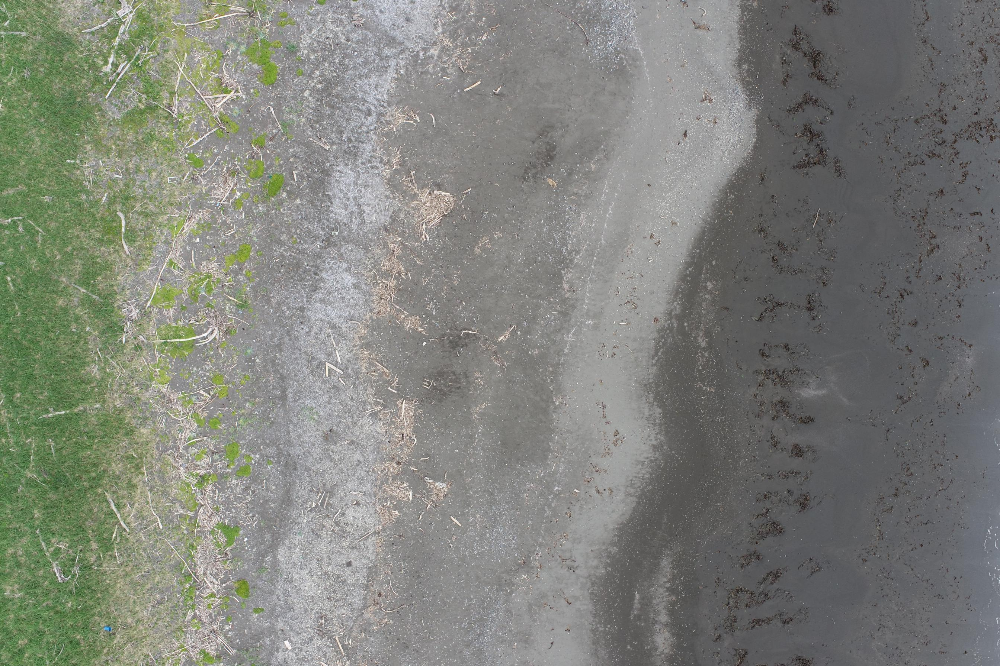

In [7]:
from PIL import Image
sample_image = Image.open('sample-image.jpg')
sample_image

Определим классы, с которыми работает модель:

In [4]:
id2label = {
    0: "background",
    1: "iron",
    2: "fishing gear",
    3: "plastic",
    4: "tree",
    5: "concrete",
    6: "rubber"
}

label2id = {v: k for k, v in id2label.items()}

Загрузим модель:

In [5]:
from transformers import SegformerImageProcessor, SegformerForSemanticSegmentation
import torch

MODEL_CHECKPOINT = 'nvidia/mit-b2'
model_path = "model.pt"

image_processor = SegformerImageProcessor.from_pretrained(MODEL_CHECKPOINT)
image_processor.do_reduce_labels = False
image_processor.reduce_labels = False
image_processor.size = {'height': 1024, 'width': 1024}

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

loaded_model = SegformerForSemanticSegmentation.from_pretrained(MODEL_CHECKPOINT,
                                                                num_labels=len(id2label),
                                                                id2label=id2label,
                                                                label2id=label2id)

loaded_model.load_state_dict(torch.load(model_path, map_location=device))
loaded_model = loaded_model.to(device)


preprocessor_config.json:   0%|          | 0.00/272 [00:00<?, ?B/s]

/usr/local/lib/python3.11/dist-packages/transformers/utils/deprecation.py:172: UserWarning: The following named arguments are not valid for `SegformerImageProcessor.__init__` and were ignored: 'feature_extractor_type'
  return func(*args, **kwargs)


config.json:   0%|          | 0.00/70.0k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/99.0M [00:00<?, ?B/s]

Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/mit-b2 and are newly initialized: ['decode_head.batch_norm.bias', 'decode_head.batch_norm.num_batches_tracked', 'decode_head.batch_norm.running_mean', 'decode_head.batch_norm.running_var', 'decode_head.batch_norm.weight', 'decode_head.classifier.bias', 'decode_head.classifier.weight', 'decode_head.linear_c.0.proj.bias', 'decode_head.linear_c.0.proj.weight', 'decode_head.linear_c.1.proj.bias', 'decode_head.linear_c.1.proj.weight', 'decode_head.linear_c.2.proj.bias', 'decode_head.linear_c.2.proj.weight', 'decode_head.linear_c.3.proj.bias', 'decode_head.linear_c.3.proj.weight', 'decode_head.linear_fuse.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Опишем функцию для обработки набора изображений заданного фиксированного размера:

In [6]:
import numpy as np
from torch import nn

palette = {1: [255, 255, 255], 2: [0, 255, 255], 3: [0, 255, 0], 4: [255, 0, 0], 5: [255, 0, 255], 6: [255, 255, 0]}
id2color = {x: y for x, y in palette.items()}

def predict(batch):
    images = [Image.fromarray(image) for image in batch]

    batch_seg = []
    batch_images = []

    for i, image in enumerate(images):
        encoding = image_processor(image, return_tensors="pt")
        pixel_values = encoding.pixel_values.to(device)
        outputs = loaded_model(pixel_values=pixel_values)
        logits = outputs.logits.cpu()

        # First, rescale logits to original image size
        upsampled_logits = nn.functional.interpolate(logits,
                                                     size=image.size[::-1],  # (height, width)
                                                     mode='bilinear',
                                                     align_corners=False)

        seg = upsampled_logits.argmax(dim=1)[0]
        batch_seg.append(seg)

        color_seg = np.zeros((seg.shape[0], seg.shape[1], 3), dtype=np.uint8)  # height, width, 3
        for label, color in id2color.items():
            color_seg[seg == label, :] = color

        img = batch[i] * 0.7 + color_seg * 0.3
        img = img.astype(np.uint8)
        batch_images.append(img)

    return batch_seg, batch_images

Теперь опишем функцию для обработки большого изображения:

In [10]:
def predict_full(image, h=512, w=512, stride=512):
    arr = np.array(image)
    img = arr

    height = img.shape[0]
    width = img.shape[1]

    if height <= h:
        n = 1
    else:
        if (height - h) % stride == 0:
            n = (height - h) // stride + 1
        else:
            n = (height - h) // stride + 2

    if width <= w:
        m = 1
    else:
        if (width - w) % stride == 0:
            m = (width - w) // stride + 1
        else:
            m = (width - w) // stride + 2

    n_m = n * m

    res_image = np.zeros((height, width, 3))
    res_mask = np.zeros((height, width))

    crops = []

    for index in range(n_m):
        row_num = index // n
        col_num = index % n

        x_min = stride * col_num
        x_max = min(stride * col_num + h, height)

        y_min = stride * row_num
        y_max = min(stride * row_num + w, width)

        img_crop = arr[x_min:x_max, y_min:y_max, ...]
        crops.append(img_crop)

    predicted_seg, predicted_images = predict(crops)

    for index in range(n_m):
        row_num = index // n
        col_num = index % n

        x_min = stride * col_num
        x_max = min(stride * col_num + h, height)

        y_min = stride * row_num
        y_max = min(stride * row_num + w, width)

        res_image[x_min:x_max, y_min:y_max, ...] = predicted_images[index]
        res_mask[x_min:x_max, y_min:y_max] = predicted_seg[index]

    res_image = np.uint8(res_image)

    return res_image, res_mask

Прогоним модель на нашем изображении:

In [12]:
res_image, res_mask = predict_full(sample_image)

<ipython-input-10-e86bacd3a382>:57: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.
  res_mask[x_min:x_max, y_min:y_max] = predicted_seg[index]


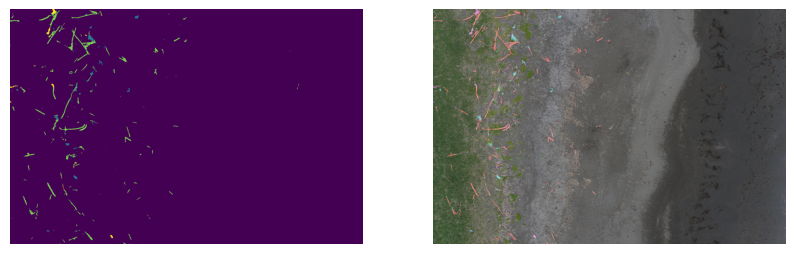

In [16]:
import matplotlib.pyplot as plt

fig,ax = plt.subplots(1,2,figsize=(10,4))
ax[0].imshow(res_mask)
ax[0].axis('off')
ax[1].imshow(res_image)
ax[1].axis('off')
plt.show()

Далее научимся вычислять параметры мусора на изображении. Зададим некоторые эвристические параметры плотности мусора, подстройки его объема исходя из параметров изображения и т.д.

In [18]:
cl_to_max_window = {
    1: 2,
    2: 2,
    3: 2,
    4: 4,
    5: 6,
    6: 3,
}

cl_to_volume_decreasing_coef = {
    1: 0.025,
    2: 0.125,
    3: 0.1,
    4: 0.125,
    5: 0.5,
    6: 0.05,
}

cl_to_name = {
    1: "железо",
    2: "рыболовные снасти",
    3: "пластик",
    4: "дерево",
    5: "бетон",
    6: "резина"
}

cl_to_density = {
    1: 2000,
    2: 100,
    3: 100,  # может быть и легче, но мне кажется, что он обычно моркый и тяжелый
    4: 200,
    5: 700,
    6: 700,
}

Функция ниже по изображению маски посчитывает агрегатные параметры мусора на изображении:

In [23]:
from skimage.util.shape import view_as_windows
import scipy.ndimage as ndimage

def strided4D_v2(arr, arr2, s):
    return view_as_windows(arr, arr2.shape, step=s)

def stride_conv_strided(arr, arr2, s):
    arr4D = strided4D_v2(arr, arr2, s=s)
    return np.tensordot(arr4D, arr2, axes=((2, 3), (0, 1)))

def separate_objects_masks(mask):
    """
    mask: должна содержать только значиния 0 и 255,
    h x w x 3, все 3 канала одинаково заполнены
    """
    res = []

    label_im, nb_labels = ndimage.label(mask)

    for i in range(nb_labels):
        mask = label_im == i + 1
        if np.sum(mask) < 80:  # filter small objects
            continue
        res.append(mask)
    return res

def calc_coefs(mask, cl):
    coefs = { "square" : 0, "volume" : 0, "mass" : 0 }
    cl_mask = mask == cl

    masks = separate_objects_masks(cl_mask)
    for v in masks:
        mass_y, mass_x = np.where(v)
        cent_y = np.average(mass_y)
        cent_x = np.average(mass_x)

        square_in_pixels = np.sum(v)

        size = 4
        kernel = np.ones((size, size))
        denom = size * size

        squares = stride_conv_strided(v, kernel, s=size) / denom

        max_window = cl_to_max_window[cl]
        k = max_window - 1

        padded = np.pad(squares, [(k, k), (k, k)], mode='constant', constant_values=0)

        kernel_hor = np.array([[1.0] * max_window])
        kernel_vert = np.array([[1.0]] * max_window)

        hor = stride_conv_strided(padded, kernel_hor, s=1)
        vert = stride_conv_strided(padded, kernel_vert, s=1)

        l = hor[k:-k, :-k]
        r = hor[k:-k, k:]
        up = vert[:-k, k:-k]
        down = vert[k:, k:-k]

        res = np.stack([l, r, up, down]).min(axis=0)

        volume_coef = cl_to_volume_decreasing_coef[cl] * np.sum(res) / np.sum(squares)
        mass_coef = cl_to_density[cl] * volume_coef
        coefs['square'] += square_in_pixels
        coefs['volume'] += volume_coef
        coefs['mass'] += mass_coef
        # coefs.append([int(cent_y), int(cent_x), square_in_pixels, volume_coef, mass_coef])

    return coefs

def get_coefs(res_mask):
    cl_coefs = {}

    for cl, n in id2label.items():
        if cl>0:
          cl_coefs[n] = calc_coefs(res_mask, cl=cl)

    return cl_coefs

coefs = get_coefs(res_mask)
coefs

{'iron': {'square': np.int64(166),
  'volume': np.float64(0.028915662650602414),
  'mass': np.float64(57.83132530120483)},
 'fishing gear': {'square': np.int64(6142),
  'volume': np.float64(2.758770667448143),
  'mass': np.float64(275.8770667448144)},
 'plastic': {'square': np.int64(296),
  'volume': np.float64(0.3257055080096555),
  'mass': np.float64(32.57055080096555)},
 'tree': {'square': np.int64(38358),
  'volume': np.float64(12.045547624263033),
  'mass': np.float64(2409.1095248526053)},
 'concrete': {'square': np.int64(2712),
  'volume': np.float64(5.527656373912045),
  'mass': np.float64(3869.3594617384315)},
 'rubber': {'square': 0, 'volume': 0, 'mass': 0}}

In [25]:
import pandas as pd
pd.DataFrame(coefs).T

,square,volume,mass
iron,166.0,0.028916,57.831325
fishing gear,6142.0,2.758771,275.877067
plastic,296.0,0.325706,32.570551
tree,38358.0,12.045548,2409.109525
concrete,2712.0,5.527656,3869.359462
rubber,0.0,0.000000,0.000000
